In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score

In [2]:
import mpld3

def save_figure(fig, filename):
    filename = './plots/' + filename
    fig.savefig(filename, transparent=False)
    mpld3.save_html(fig, filename+".html", template_type='simple')
    mpld3.save_json(fig, filename+".json")

In [3]:
x_res = pd.read_csv('x_res.csv')
y_res = pd.read_csv('y_res.csv')

print(x_res.shape)
print(y_res.shape)

(49650, 26)
(49650, 1)


In [4]:
X_train, X_val, y_train, y_val = train_test_split(x_res, y_res, test_size=0.3, random_state=0)

In [5]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

In [6]:
metrics = [ 
      keras.metrics.BinaryAccuracy(name='accuracy'),
      keras.metrics.AUC(name='auc'),
      keras.metrics.AUC(name='prc', curve='PR'), # precision-recall curve
]

ES=tf.keras.callbacks.EarlyStopping(monitor="val_auc",patience=20,restore_best_weights=True, mode='max', verbose=1)

Rlr =tf.keras.callbacks.ReduceLROnPlateau(monitor='val_auc', factor=0.5,
                              patience=10, min_lr=0.000001)

def create_model(input_shape = (X_train.shape[1],)):
    model = keras.Sequential()
    model.add(keras.layers.Dense(5,activation='relu',input_shape=input_shape))
    model.add(keras.layers.Dense(1,activation='sigmoid'))
    model.compile(optimizer='adam',loss = 'binary_crossentropy', metrics = metrics)
    return model
              
# model = KerasClassifier(create_model, verbose=1)
model = create_model()


model.fit(x=X_train,
          y=y_train,
          epochs = 500,
          batch_size=512,
          validation_data =(X_val, y_val),
          callbacks=[ES, Rlr],
#           class_weight = {0: zero_weight, 1: one_weight}
         )

Epoch 1/500
68/68 [==============================] - 1s 8ms/step - loss: 0.7755 - accuracy: 0.5482 - auc: 0.5722 - prc: 0.5464 - val_loss: 0.7269 - val_accuracy: 0.5692 - val_auc: 0.5976 - val_prc: 0.5625
Epoch 2/500
68/68 [==============================] - 0s 6ms/step - loss: 0.6952 - accuracy: 0.5945 - auc: 0.6229 - prc: 0.5969 - val_loss: 0.6769 - val_accuracy: 0.6140 - val_auc: 0.6475 - val_prc: 0.6198
Epoch 3/500
68/68 [==============================] - 0s 4ms/step - loss: 0.6592 - accuracy: 0.6292 - auc: 0.6671 - prc: 0.6521 - val_loss: 0.6506 - val_accuracy: 0.6376 - val_auc: 0.6828 - val_prc: 0.6706
Epoch 4/500
68/68 [==============================] - 0s 6ms/step - loss: 0.6390 - accuracy: 0.6482 - auc: 0.6963 - prc: 0.6960 - val_loss: 0.6339 - val_accuracy: 0.6535 - val_auc: 0.7051 - val_prc: 0.7070
Epoch 5/500
68/68 [==============================] - 0s 5ms/step - loss: 0.6258 - accuracy: 0.6623 - auc: 0.7145 - prc: 0.7258 - val_loss: 0.6224 - val_accuracy: 0.6638 - val_auc: 

Epoch 41/500
68/68 [==============================] - 0s 5ms/step - loss: 0.5593 - accuracy: 0.7032 - auc: 0.7621 - prc: 0.8051 - val_loss: 0.5631 - val_accuracy: 0.7020 - val_auc: 0.7578 - val_prc: 0.7996
Epoch 42/500
68/68 [==============================] - 0s 4ms/step - loss: 0.5590 - accuracy: 0.7030 - auc: 0.7623 - prc: 0.8053 - val_loss: 0.5630 - val_accuracy: 0.7022 - val_auc: 0.7579 - val_prc: 0.7997
Epoch 43/500
68/68 [==============================] - 0s 4ms/step - loss: 0.5589 - accuracy: 0.7034 - auc: 0.7623 - prc: 0.8053 - val_loss: 0.5629 - val_accuracy: 0.7025 - val_auc: 0.7580 - val_prc: 0.7997
Epoch 44/500
68/68 [==============================] - 0s 5ms/step - loss: 0.5588 - accuracy: 0.7033 - auc: 0.7624 - prc: 0.8054 - val_loss: 0.5628 - val_accuracy: 0.7026 - val_auc: 0.7581 - val_prc: 0.7998
Epoch 45/500
68/68 [==============================] - 0s 3ms/step - loss: 0.5587 - accuracy: 0.7034 - auc: 0.7625 - prc: 0.8054 - val_loss: 0.5627 - val_accuracy: 0.7026 - val_

Epoch 81/500
68/68 [==============================] - 0s 3ms/step - loss: 0.5568 - accuracy: 0.7040 - auc: 0.7638 - prc: 0.8065 - val_loss: 0.5610 - val_accuracy: 0.7043 - val_auc: 0.7593 - val_prc: 0.8007
Epoch 82/500
68/68 [==============================] - 0s 3ms/step - loss: 0.5568 - accuracy: 0.7040 - auc: 0.7638 - prc: 0.8065 - val_loss: 0.5610 - val_accuracy: 0.7043 - val_auc: 0.7593 - val_prc: 0.8007
Epoch 83/500
68/68 [==============================] - 0s 3ms/step - loss: 0.5568 - accuracy: 0.7040 - auc: 0.7638 - prc: 0.8065 - val_loss: 0.5610 - val_accuracy: 0.7042 - val_auc: 0.7593 - val_prc: 0.8008
Epoch 84/500
68/68 [==============================] - 0s 3ms/step - loss: 0.5568 - accuracy: 0.7041 - auc: 0.7638 - prc: 0.8065 - val_loss: 0.5610 - val_accuracy: 0.7042 - val_auc: 0.7593 - val_prc: 0.8008
Epoch 85/500
68/68 [==============================] - 0s 3ms/step - loss: 0.5568 - accuracy: 0.7040 - auc: 0.7639 - prc: 0.8065 - val_loss: 0.5610 - val_accuracy: 0.7042 - val_

Epoch 121/500
68/68 [==============================] - 0s 3ms/step - loss: 0.5567 - accuracy: 0.7040 - auc: 0.7639 - prc: 0.8065 - val_loss: 0.5609 - val_accuracy: 0.7042 - val_auc: 0.7594 - val_prc: 0.8009
Epoch 122/500
68/68 [==============================] - 0s 3ms/step - loss: 0.5567 - accuracy: 0.7040 - auc: 0.7639 - prc: 0.8065 - val_loss: 0.5609 - val_accuracy: 0.7041 - val_auc: 0.7594 - val_prc: 0.8009
Epoch 123/500
68/68 [==============================] - 0s 3ms/step - loss: 0.5567 - accuracy: 0.7040 - auc: 0.7639 - prc: 0.8065 - val_loss: 0.5609 - val_accuracy: 0.7041 - val_auc: 0.7594 - val_prc: 0.8009
Epoch 124/500
68/68 [==============================] - 0s 3ms/step - loss: 0.5567 - accuracy: 0.7040 - auc: 0.7639 - prc: 0.8065 - val_loss: 0.5609 - val_accuracy: 0.7041 - val_auc: 0.7594 - val_prc: 0.8009
Epoch 125/500
68/68 [==============================] - 0s 3ms/step - loss: 0.5567 - accuracy: 0.7040 - auc: 0.7639 - prc: 0.8065 - val_loss: 0.5609 - val_accuracy: 0.7042 -

68/68 [==============================] - 0s 3ms/step - loss: 0.5566 - accuracy: 0.7040 - auc: 0.7640 - prc: 0.8066 - val_loss: 0.5608 - val_accuracy: 0.7043 - val_auc: 0.7595 - val_prc: 0.8009
Epoch 161/500
68/68 [==============================] - 0s 4ms/step - loss: 0.5566 - accuracy: 0.7040 - auc: 0.7640 - prc: 0.8066 - val_loss: 0.5608 - val_accuracy: 0.7043 - val_auc: 0.7595 - val_prc: 0.8009
Epoch 162/500
68/68 [==============================] - 0s 3ms/step - loss: 0.5566 - accuracy: 0.7041 - auc: 0.7640 - prc: 0.8066 - val_loss: 0.5608 - val_accuracy: 0.7043 - val_auc: 0.7595 - val_prc: 0.8009
Epoch 163/500
68/68 [==============================] - 0s 3ms/step - loss: 0.5566 - accuracy: 0.7040 - auc: 0.7640 - prc: 0.8066 - val_loss: 0.5608 - val_accuracy: 0.7043 - val_auc: 0.7595 - val_prc: 0.8009
Epoch 164/500
68/68 [==============================] - 0s 2ms/step - loss: 0.5566 - accuracy: 0.7040 - auc: 0.7640 - prc: 0.8066 - val_loss: 0.5608 - val_accuracy: 0.7041 - val_auc: 0.75

In [7]:
print('AUC', roc_auc_score(y_val,model.predict(X_val)))

AUC 0.7594030615004597


In [8]:
from aletheia import *

fnames = x_res.columns.tolist()

coefs = [layer.kernel.numpy() for layer in model.layers]
intercepts = [layer.bias.numpy() for layer in model.layers]
clf = UnwrapperClassifier(coefs, intercepts, feature_names=fnames)
clf.fit(X_train, y_train)

In [9]:
clf.summary()

,Count,Response Mean,Response Std,Local AUC,Global AUC
0,3913.0,0.351648,0.477485,0.582836,0.588169
1,3778.0,0.282954,0.450434,0.550345,0.619106
2,2187.0,0.773205,0.418759,0.832064,0.746410
3,2126.0,0.353716,0.478122,0.572051,0.562690
4,2095.0,0.467303,0.498930,0.623562,0.741292
5,2082.0,0.791066,0.406547,0.814973,0.737438
6,1682.0,0.897741,0.302989,0.833729,0.741998
7,1632.0,0.737745,0.439861,0.794674,0.745165
8,1564.0,0.733376,0.442194,0.779960,0.746626
9,1516.0,0.302770,0.459457,0.543236,0.556065


In [10]:
fnames

['AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'NAME_EDUCATION_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'REG_CITY_NOT_LIVE_CITY_1',
 'FLAG_EMP_PHONE_1',
 'FLAG_OWN_CAR_Y',
 'FLAG_PHONE_1',
 'REG_CITY_NOT_WORK_CITY_1',
 'LIVE_REGION_NOT_WORK_REGION_1',
 'NAME_CONTRACT_TYPE_Revolving loans',
 'LIVE_CITY_NOT_WORK_CITY_1',
 'FLAG_EMAIL_1',
 'FLAG_WORK_PHONE_1',
 'REGION_RATING_CLIENT_2',
 'REGION_RATING_CLIENT_3',
 'FLAG_DOCUMENT_8_1',
 'FLAG_OWN_REALTY_Y']

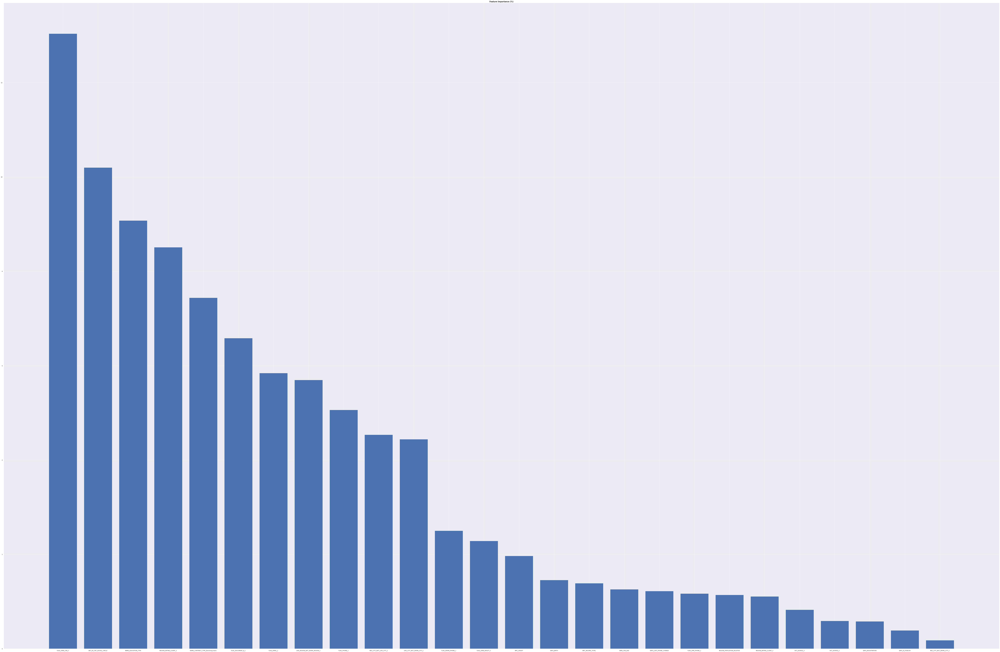

In [11]:
fig = clf.feature_importance_plot(figsize=(150, 100))

In [12]:
save_figure(fig, 'feature_importance')

In [13]:
feature_idx = [x+1 for x in range(26)]

In [14]:
fig = clf.pair_plot(feature_idx, nllms=100, offdiagsmooth=True, figsize=(200, 200))

<ipython-input-14-08c8d3f054e6>:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig = clf.pair_plot(feature_idx, nllms=100, offdiagsmooth=True, figsize=(200, 200))


In [15]:
save_figure(fig, 'pair_plot')

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


<ipython-input-16-09a1dc8d5200>:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig = clf.intercept_plot(feature_idx, nllms=50, figsize=(200, 4))


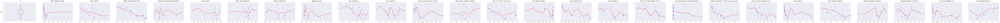

In [16]:
fig = clf.intercept_plot(feature_idx, nllms=50, figsize=(200, 4))

In [17]:
save_figure(fig, 'intercept_plot')

Count            2780.000000
Response Mean       0.295324
Response Std        0.456188
Local AUC           0.548646
Global AUC          0.620797
Name: 1, dtype: float64


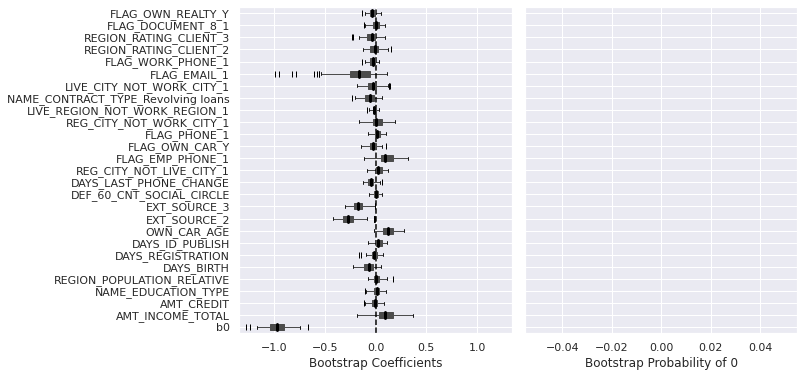

Count            2236.000000
Response Mean       0.348390
Response Std        0.476460
Local AUC           0.591011
Global AUC          0.634905
Name: 2, dtype: float64


KeyboardInterrupt: 

In [22]:
# takes a long time to render
# for i in feature_idx:
#     fig = clf.local_inference_bootstrap(i)
#     save_figure(fig, 'local_inference_' + fnames[i-1])

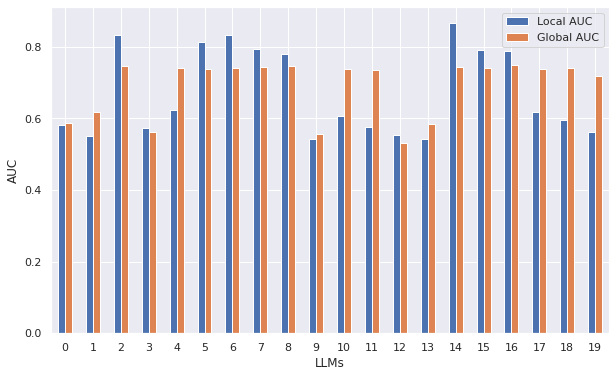

In [22]:
fig = clf.diagperf_bar()

In [25]:
save_figure(fig.figure, 'diagperf_bar')

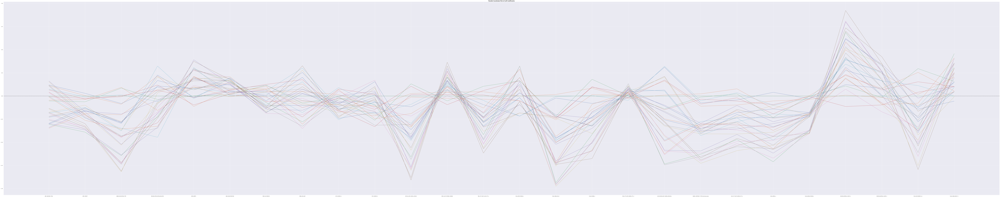

In [26]:
fig = clf.pc_plot(figsize=(250,50))

In [27]:
save_figure(fig, 'pc_plot')

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


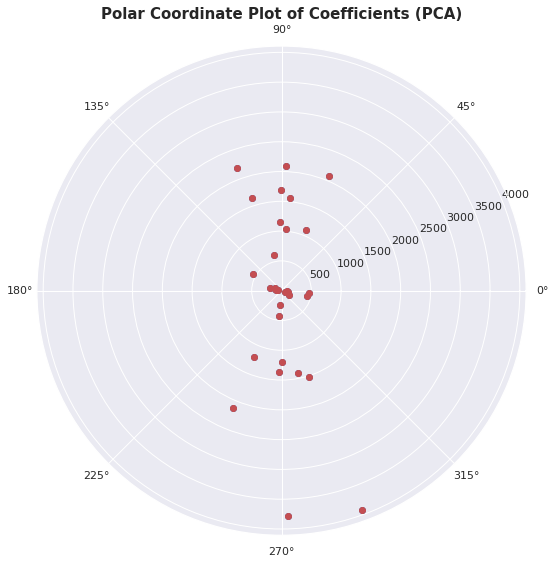

In [28]:
fig = clf.polar_plot(figsize=(9, 9))

In [29]:
save_figure(fig, 'polar_plog')

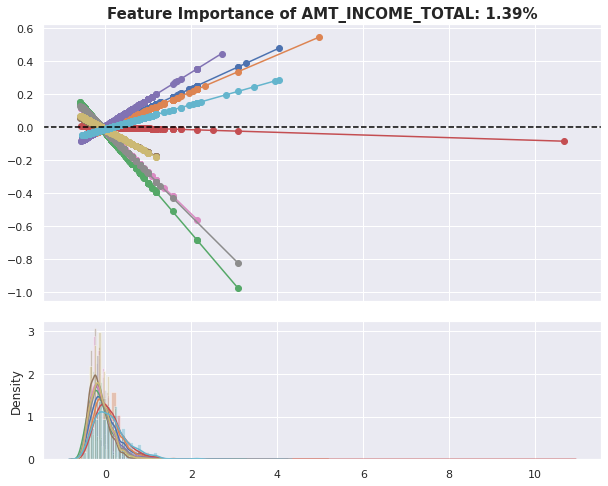

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


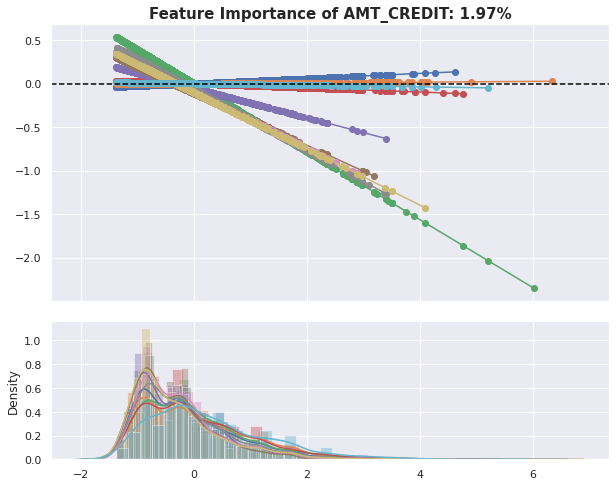

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


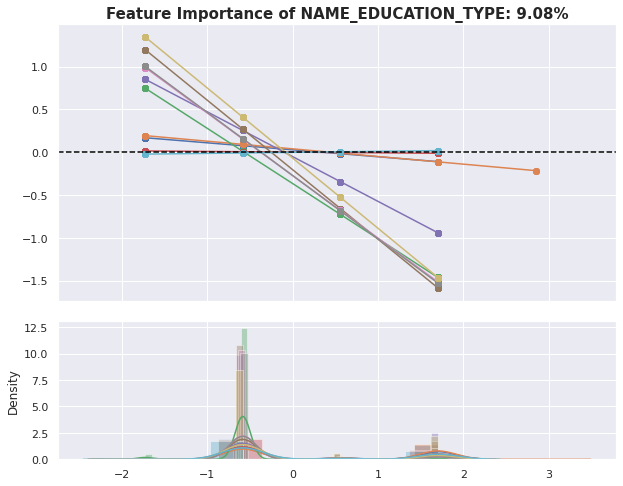

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


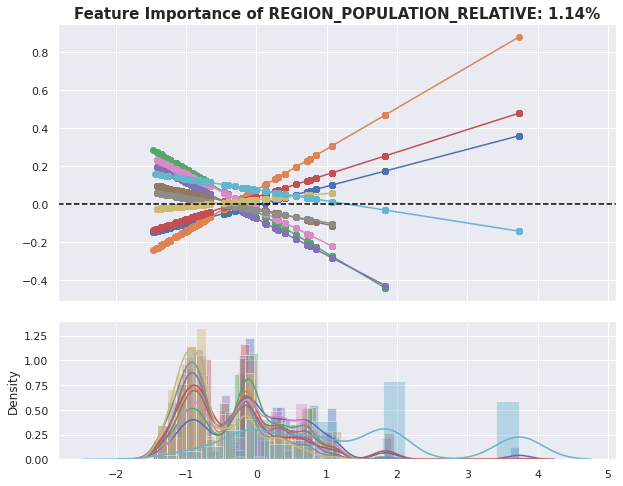

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


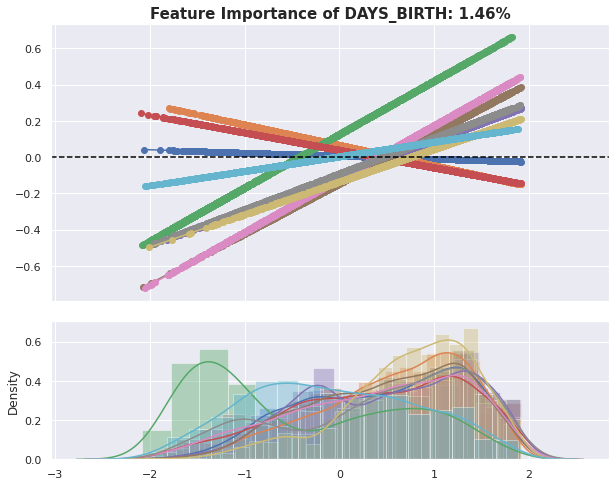

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


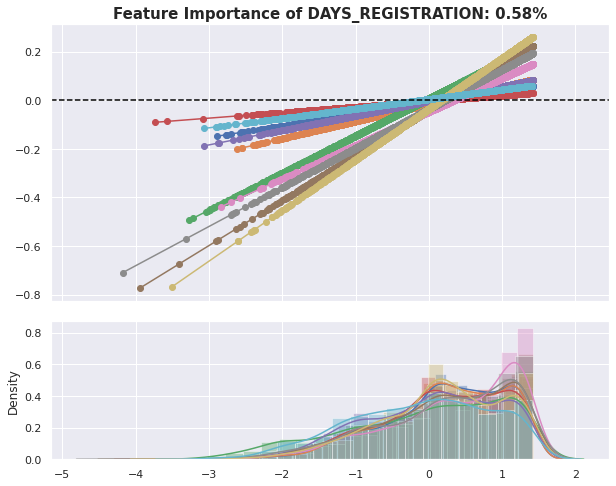

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


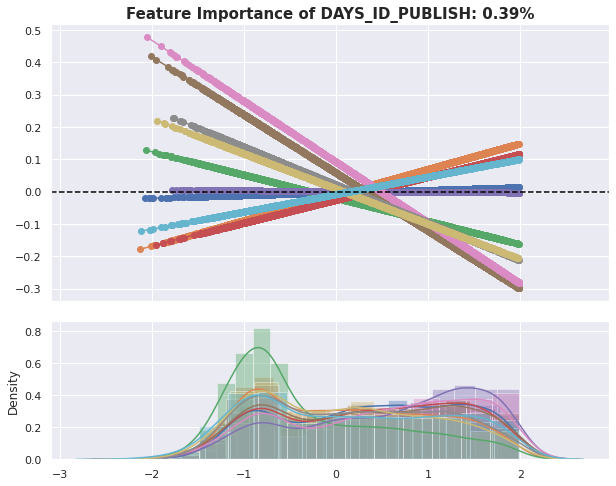

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


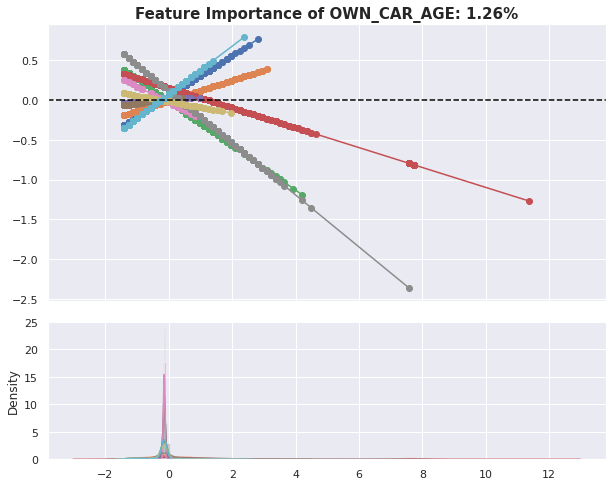

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


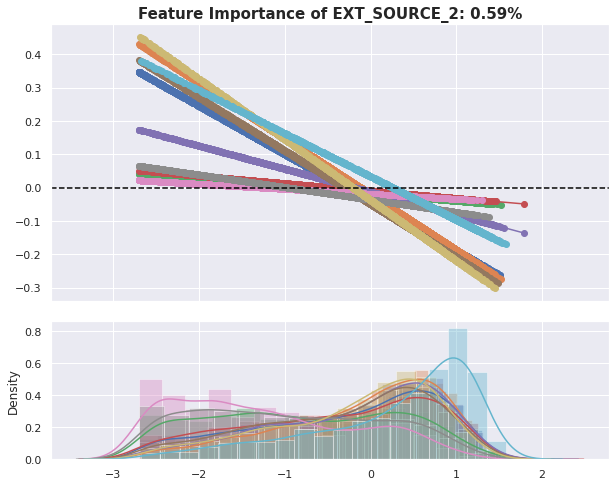

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


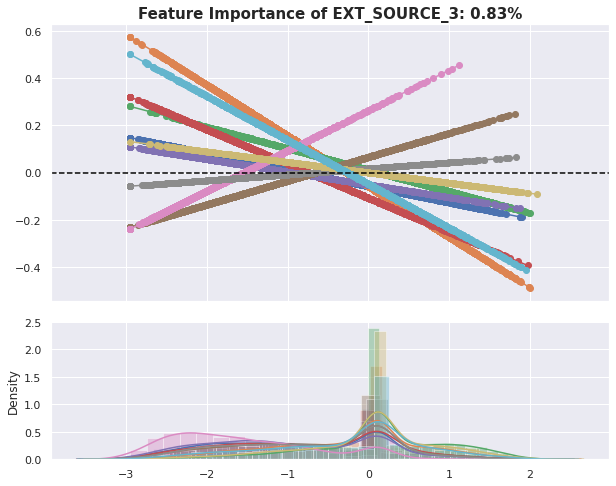

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


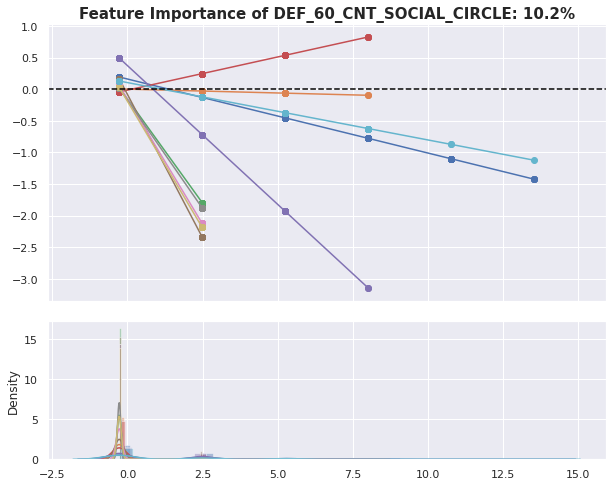

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


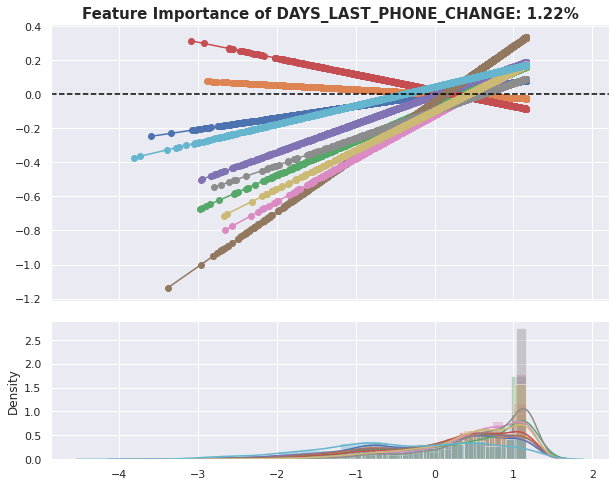

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


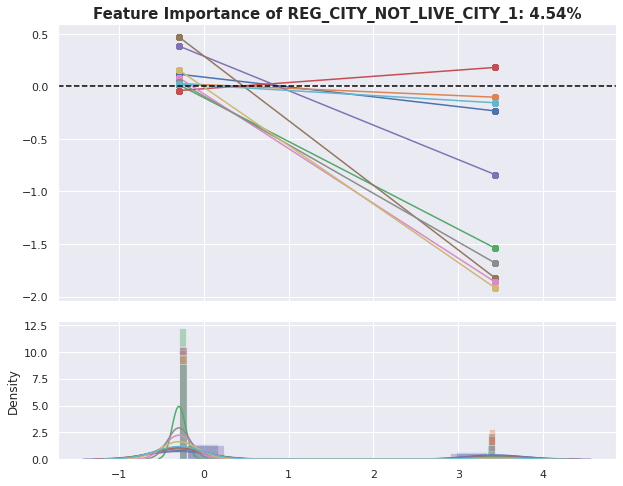

/home/rocket_chat/anaconda3/lib/python3.8/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


LinAlgError: singular matrix

<Figure size 720x576 with 0 Axes>

In [30]:
# to remove futurewarnings, something that we cannot avoid
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

for i in feature_idx:
    fig = clf.profile_plot(feature_id = i)
    save_figure(fig, 'profile_plot_' + fnames[i-1])